**Magic Commands that are useful**
* autoreload is helpful because it reloads packages automatically once they are changed (i.e., pyrankability)
* matploblib inline is helpful because it tells the notebook to output figures to the notebook

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

**Convention on imports**
* It is convention to put builtin imports first
* Then standard third party imports
* Then custom imports (pyrankability)

In [1]:
import copy
import os

In [2]:
import pandas as pd
import numpy as np

In [3]:
import sys
from pathlib import Path
home = str(Path.home())

sys.path.insert(0,"%s/rankability_toolbox_dev"%home)

In [4]:
sys.path.insert(0,"%s/sensitivity_study/src"%home)
from sensitivity_tests import *

In [5]:
from sensitivity_tests import *

In [6]:
import pyrankability

In [180]:
import joblib
loaded = joblib.load("MarchMadnessAnalysis.joblib.z")
results = loaded['results']
Vs = loaded['Vs']
games = loaded['games']

In [181]:
from base import *

In [182]:
list(results.keys())

['lop', 'massey', 'colley', 'hillside(t=0)', 'hillside(t=0,nan=>0)']

In [223]:
from scipy.stats import skew

all_score_df = pd.DataFrame(columns=['V_method','Parameters','Method','Year','# X* frac','delta','# X* frac top 20'])
c=0
for method in results.keys():
    if "lop" in method or "hillside" in method:
        for V_method in results[method].keys():
            for year in results[method][V_method].keys():
                for parameters in results[method][V_method][year].keys():
                    k,details = results[method][V_method][year][parameters]
                    V = Vs[V_method][year][parameters]
                    x = pd.DataFrame(details['x'],index=V.index,columns=V.columns)
                    r = x.sum(axis=0)
                    order = np.argsort(r)
                    xstar = x.iloc[order,:].iloc[:,order]
                    xstar.loc[:,:] = pyrankability.common.threshold_x(xstar.values)
                    inxs = np.triu_indices(len(xstar),k=1)
                    xstar_upper = xstar.values[inxs[0],inxs[1]]
                    nfrac_upper = sum((xstar_upper > 0) & (xstar_upper < 1))
                    flat_frac = ((xstar > 0) & (xstar < 1)).sum(axis=0)
                    nfrac_top_40 = flat_frac.iloc[:20].sum()
                    entry = pd.Series([V_method,parameters,method,year,nfrac_upper*2,k,nfrac_top_40],all_score_df.columns,name=c)
                    c+=1
                    all_score_df = all_score_df.append(entry)
all_score_df["Year"] = all_score_df["Year"].astype(int)
all_score_df.set_index("Year",inplace=True)

In [184]:
all_score_df

,V_method,Parameters,Method,# X* frac,delta,# X* frac top 20
Year,,,,,,
2002,direct,direct_thres=0.000000,lop,3110,56.0,811
2002,direct,direct_thres=1.000000,lop,3186,52.0,853
2002,direct,direct_thres=2.000000,lop,3252,44.0,898
2002,direct,direct_thres=5.000000,lop,3172,27.0,804
2003,direct,direct_thres=0.000000,lop,2380,47.0,597
...,...,...,...,...,...,...
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=2.000000,we...","hillside(t=0,nan=>0)",20,45140.0,8
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=2.000000,we...","hillside(t=0,nan=>0)",40,44750.0,13
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=5.000000,we...","hillside(t=0,nan=>0)",134,44645.0,40


In [224]:
madness_data = pd.read_excel('data/March Madness Targets.xlsx',skiprows=1)
int_columns = ["Colley ESPN","Massey ESPN"]
real_columns = ["Upset measure","Variance of upset","Colley %","Massey %"]
madness_data[int_columns] = madness_data[int_columns].astype(int)
madness_data[real_columns] = madness_data[real_columns].astype(float)
madness_data
madness_data["Mean C & M ESPN"] = (madness_data['Colley ESPN'] + madness_data['Massey ESPN'])/2
madness_data["Mean C & M %"] = (madness_data['Colley %'] + madness_data['Massey %'])/2
madness_data=madness_data.set_index('Year')
madness_data

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Year,,,,,,,,
2001,NaN,NaN,750,58.73,1520,66.67,1135.0,62.700
2002,20.25,1.126,720,58.73,800,65.08,760.0,61.905
2003,24.00,0.667,720,65.08,880,66.67,800.0,65.875
2004,21.00,0.590,710,66.67,1070,66.67,890.0,66.670
2005,24.50,0.428,1080,68.25,1450,69.84,1265.0,69.045
2006,25.00,1.062,570,55.56,650,63.49,610.0,59.525
2007,14.50,0.043,1100,76.19,920,68.25,1010.0,72.220
2008,17.50,0.442,1140,71.43,1550,74.60,1345.0,73.015
2009,18.25,0.168,850,65.08,1210,66.67,1030.0,65.875


In [225]:
len(madness_data)

19

In [251]:
data = all_score_df.join(madness_data).dropna()

In [252]:
data

,V_method,Parameters,Method,# X* frac,delta,# X* frac top 20,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Year,,,,,,,,,,,,,,
2002,direct,direct_thres=0.000000,lop,3110,56.00,811,20.25,1.126,720,58.73,800,65.08,760.0,61.905
2002,direct,direct_thres=1.000000,lop,3186,52.00,853,20.25,1.126,720,58.73,800,65.08,760.0,61.905
2002,direct,direct_thres=2.000000,lop,3252,44.00,898,20.25,1.126,720,58.73,800,65.08,760.0,61.905
2002,direct,direct_thres=5.000000,lop,3172,27.00,804,20.25,1.126,720,58.73,800,65.08,760.0,61.905
2002,direct_indirect_weighted,"direct_thres=0.000000,spread_thres=0.000000,we...",lop,1204,223.75,208,20.25,1.126,720,58.73,800,65.08,760.0,61.905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=2.000000,we...","hillside(t=0,nan=>0)",20,45140.00,8,27.25,0.993,790,58.73,1100,61.90,945.0,60.315
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=2.000000,we...","hillside(t=0,nan=>0)",40,44750.00,13,27.25,0.993,790,58.73,1100,61.90,945.0,60.315
2018,direct_indirect_weighted,"direct_thres=5.000000,spread_thres=5.000000,we...","hillside(t=0,nan=>0)",134,44645.00,40,27.25,0.993,790,58.73,1100,61.90,945.0,60.315


### Scale features

In [253]:
from sklearn.preprocessing import scale
features = ["# X* frac","delta","# X* frac top 20"]
scaled_data = data.copy().reset_index().set_index(['V_method',"Parameters","Method"])
for ix in scaled_data.index.unique():
    scaled_data.loc[ix,features] = scale(scaled_data.loc[ix,features])
data = scaled_data.reset_index()

/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may imp

/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may imp

/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.

/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may imp

/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/opt/tljh/user/lib/python3.7/site-packages/IPython/core/async_helpers.py:68: PerformanceWarning: indexing past lexsort depth may impact performance.
  coro.send(None)
/opt/tljh/user/lib/python3.7/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.

In [254]:
data = data.loc[data['Method']!='hillside(t=0,nan=>0)']

In [255]:
data['Upset measure']

0       20.25
1       20.25
2       20.25
3       20.25
4       20.25
        ...  
2595    27.25
2596    27.25
2597    27.25
2598    27.25
2599    27.25
Name: Upset measure, Length: 1768, dtype: float64

In [256]:
import sklearn.linear_model as skl_lm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.svm import SVR
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold

# based on 5x2 from http://ieeexplore.ieee.org/document/6790639/
# Dietterich also recommends a resampling method of his own devising called 5×2 cross-validation that involves 5 repeats of 2-fold cross-validation.
# Two folds are chosen to ensure that each observation appears only in the train or 
# test dataset for a single estimate of model skill. A paired Student’s t-test is used 
# on the results, updated to better reflect the limited degrees of freedom given the 
# dependence between the estimated skill scores.
# This interval is 2.571 for a 5% threshold and 3.365 for a 2% thresholds (https://www.medcalc.org/manual/t-distribution.php)

def evaluate(df,pred_col,model1,model2,param_grid1={},param_grid2={},feature_cols=["delta","# X* frac","# X* frac top 20"]):
    trn = df[feature_cols]
    target = df[pred_col]
    # Choose seeds for each 2-fold iterations
    seeds = [13, 51, 137, 24659, 347]
    # Initialize the score difference for the 1st fold of the 1st iteration 
    p_1_1 = 0.0
    # Initialize a place holder for the variance estimate
    s_sqr = 0.0
    # Initialize scores list for both classifiers
    scores_1 = []
    scores_2 = []
    diff_scores = []
    # Iterate through 5 2-fold CV
    for i_s, seed in enumerate(seeds):
        # Split the dataset in 2 parts with the current seed
        folds = KFold(n_splits=2, shuffle=True, random_state=seed)
        # Initialize score differences
        p_i = np.zeros(2)
        # Go through the current 2 fold
        for i_f, (trn_idx, val_idx) in enumerate(folds.split(target, target)):
            # Split the data
            trn_x, trn_y = trn.iloc[trn_idx], target.iloc[trn_idx]
            val_x, val_y = trn.iloc[val_idx], target.iloc[val_idx]
            cv = [(slice(None), slice(None))] # don't perform any cross validation
            grid1 = GridSearchCV(model1,param_grid1,verbose=0,n_jobs=-1,cv=cv,refit=True)
            grid2 = GridSearchCV(model2,param_grid2,verbose=0,n_jobs=-1,cv=cv,refit=True)
            # Train classifiers
            grid1.fit(trn_x, trn_y)
            grid2.fit(trn_x, trn_y)
            best_estimator1 = grid1.best_estimator_
            best_estimator2 = grid2.best_estimator_
            errors1 = val_y - best_estimator1.predict(val_x).flat
            errors2 = val_y - best_estimator2.predict(val_x).flat
            score_1 = -np.mean(np.abs(errors1))
            score_2 = -np.mean(np.abs(errors2))

            # keep score history for mean and stdev calculation
            scores_1.append(score_1)
            scores_2.append(score_2)
            diff_scores.append(score_1 - score_2)
            #print("Fold %2d score difference = %.6f" % (i_f + 1, score_1 - score_2))
            # Compute score difference for current fold  
            p_i[i_f] = score_1 - score_2
            # Keep the score difference of the 1st iteration and 1st fold
            if (i_s == 0) & (i_f == 0):
                p_1_1 = p_i[i_f]
        # Compute mean of scores difference for the current 2-fold CV
        p_i_bar = (p_i[0] + p_i[1]) / 2
        # Compute the variance estimate for the current 2-fold CV
        s_i_sqr = (p_i[0] - p_i_bar) ** 2 + (p_i[1] - p_i_bar) ** 2 
        # Add up to the overall variance
        s_sqr += s_i_sqr

    # Compute t value as the first difference divided by the square root of variance estimate
    t_bar = p_1_1 / ((s_sqr / 5) ** .5) 
 
    return pd.Series([t_bar,np.mean(diff_scores), np.std(diff_scores),np.mean(scores_1),np.mean(scores_2),np.std(scores_1),np.std(scores_2)],index=["t_bar","Difference Mean","Difference Stdev","Mean Score 1","Mean Score 2","Stdev 1","Stdev 2"])



In [257]:
pred_col = 'Upset measure'

## Analysis

In [258]:
svr_dummy_results = data.groupby(["V_method","Parameters","Method"]).apply(evaluate,pred_col,DummyRegressor(),SVR(gamma='scale'),param_grid1 = {},
                                                                           param_grid2 = {'C': [0.1,0.5,0.75,1.], 
                                                                                   'epsilon': [0.1,0.5,0.75,1.],
                                                                                   'kernel': ['linear']#, 'poly', 'rbf', 'sigmoid'],
                                                                                  })


In [259]:
svr_dummy_results.sort_values(by='Mean Score 2').tail(10).iloc[::-1]

t_bar  \
V_method                 Parameters                                         Method                    
direct_indirect_weighted direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0) -1.093689   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0) -1.093689   
                         direct_thres=1.000000,spread_thres=0.000000,wei... lop           -0.616904   
                         direct_thres=1.000000,spread_thres=1.000000,wei... lop           -0.616904   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)  0.042114   
                         direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0)  0.042114   
direct                   direct_thres=2.000000                              hillside(t=0) -0.225288   
direct_indirect_weighted direct_thres=2.000000,spread_thres=1.000000,wei... lop            0.020785   
                         direct_thres=2.000000,spread_thres=0.000000,wei... lop            0.020785   
                         direct_thres=2.000000,spread_thres=2.000000,wei... hillside(t=0)  0.057760   

                                                                                           Difference Mean  \
V_method                 Parameters                                         Method                           
direct_indirect_weighted direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0)        -0.320529   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)        -0.320529   
                         direct_thres=1.000000,spread_thres=0.000000,wei... lop                  -0.295957   
                         direct_thres=1.000000,spread_thres=1.000000,wei... lop                  -0.295957   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)        -0.254772   
                         direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0)        -0.254772   
direct                   direct_thres=2.000000                              hillside(t=0)        -0.159295   
direct_indirect_weighted direct_thres=2.000000,spread_thres=1.000000,wei... lop                  -0.157162   
                         direct_thres=2.000000,spread_thres=0.000000,wei... lop                  -0.157162   
                         direct_thres=2.000000,spread_thres=2.000000,wei... hillside(t=0)        -0.137052   

                                                                                           Difference Stdev  \
V_method                 Parameters                                         Method                            
direct_indirect_weighted direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0)          0.750302   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)          0.750302   
                         direct_thres=1.000000,spread_thres=0.000000,wei... lop                    0.461866   
                         direct_thres=1.000000,spread_thres=1.000000,wei... lop                    0.461866   
                         direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)          0.372185   
                         direct_thres=0.000000,spread_thres=1.000000,wei... hillside(t=0)          0.372185   
direct                   direct_thres=2.000000                              hillside(t=0)          0.740982   
direct_indirect_weighted direct_thres=2.000000,spread_thres=1.000000,wei... lop                    0.471653   
                         direct_thres=2.000000,spread_thres=0.000000,wei... lop                    0.471653   
                         direct_thres=2.000000,spread_thres=2.000000,wei... hillside(t=0)          0.431006   

                                                                                           Mean Score 1  \
V_method                 Parameters                                         Method              

In [260]:
def get_min_results(results,method=None):
    if method is None:
        dt = results.reset_index().set_index(['Method','Parameters'])
    else:
        dt = results.reset_index().set_index('Method').loc[method].reset_index().set_index(['Method','Parameters'])
    min_results = dt.groupby('V_method')['Mean Score 2'].idxmax() # the weird max and min is because of the negative above
    direct_method = min_results.loc['direct'][0]
    direct_parameters = min_results.loc['direct'][1]
    indirect_method = min_results.loc['direct_indirect_weighted'][0]
    indirect_parameters = min_results.loc['direct_indirect_weighted'][1]
    return dt.loc[min_results.values],min_results,direct_method,direct_parameters,indirect_method,indirect_parameters

In [261]:
num_min_results,min_results,direct_method,direct_parameters,indirect_method,indirect_parameters = get_min_results(svr_dummy_results,method='hillside(t=0)')
num_min_results

V_method  \
Method        Parameters                                                                     
hillside(t=0) direct_thres=2.000000                                                 direct   
              direct_thres=0.000000,spread_thres=0.000000,wei...  direct_indirect_weighted   

                                                                     t_bar  \
Method        Parameters                                                     
hillside(t=0) direct_thres=2.000000                              -0.225288   
              direct_thres=0.000000,spread_thres=0.000000,wei... -1.093689   

                                                                  Difference Mean  \
Method        Parameters                                                            
hillside(t=0) direct_thres=2.000000                                     -0.159295   
              direct_thres=0.000000,spread_thres=0.000000,wei...        -0.320529   

                                                                  Difference Stdev  \
Method        Parameters                                                             
hillside(t=0) direct_thres=2.000000                                       0.740982   
              direct_thres=0.000000,spread_thres=0.000000,wei...          0.750302   

                                                                  Mean Score 1  \
Method        Parameters                                                         
hillside(t=0) direct_thres=2.000000                                   -3.46875   
              direct_thres=0.000000,spread_thres=0.000000,wei...      -3.46875   

                                                                  Mean Score 2  \
Method        Parameters                                                         
hillside(t=0) direct_thres=2.000000                                  -3.309455   
              direct_thres=0.000000,spread_thres=0.000000,wei...     -3.148221   

                                                                   Stdev 1  \
Method        Parameters                                                     
hillside(t=0) direct_thres=2.000000                               0.497457   
              direct_thres=0.000000,spread_thres=0.000000,wei...  0.497457   

                                                                   Stdev 2  
Method        Parameters                                                    
hillside(t=0) direct_thres=2.000000                               0.937880  
              direct_thres=0.000000,spread_thres=0.000000,wei...  0.710055

In [262]:
num_min_results,min_results,direct_method,direct_parameters,indirect_method,indirect_parameters = get_min_results(svr_dummy_results,method='lop')
num_min_results

V_method  \
Method Parameters                                                                     
lop    direct_thres=0.000000                                                 direct   
       direct_thres=1.000000,spread_thres=0.000000,wei...  direct_indirect_weighted   

                                                              t_bar  \
Method Parameters                                                     
lop    direct_thres=0.000000                              -0.275018   
       direct_thres=1.000000,spread_thres=0.000000,wei... -0.616904   

                                                           Difference Mean  \
Method Parameters                                                            
lop    direct_thres=0.000000                                      0.319681   
       direct_thres=1.000000,spread_thres=0.000000,wei...        -0.295957   

                                                           Difference Stdev  \
Method Parameters                                                             
lop    direct_thres=0.000000                                       0.544298   
       direct_thres=1.000000,spread_thres=0.000000,wei...          0.461866   

                                                           Mean Score 1  \
Method Parameters                                                         
lop    direct_thres=0.000000                                   -3.46875   
       direct_thres=1.000000,spread_thres=0.000000,wei...      -3.46875   

                                                           Mean Score 2  \
Method Parameters                                                         
lop    direct_thres=0.000000                                  -3.788431   
       direct_thres=1.000000,spread_thres=0.000000,wei...     -3.172793   

                                                            Stdev 1   Stdev 2  
Method Parameters                                                              
lop    direct_thres=0.000000                               0.497457  0.794908  
       direct_thres=1.000000,spread_thres=0.000000,wei...  0.497457  0.420499

### Choose a method to investigate

In [320]:
method = 'hillside(t=0)'
#method = 'lop'
V_method = 'direct_indirect_weighted'

In [321]:
num_min_results,min_results,direct_method,direct_parameters,indirect_method,indirect_parameters = get_min_results(svr_dummy_results,method=method)
if V_method == 'direct':
    parameters = direct_parameters
elif V_method == 'direct_indirect_weighted':
    parameters = indirect_parameters
else:
    raise Exception('Not a valid V_method')
top_data = data.reset_index().set_index(['V_method','Parameters','Method']).loc[(V_method,parameters,indirect_method)]
top_data.head()

/opt/tljh/user/lib/python3.7/site-packages/ipykernel_launcher.py:8: PerformanceWarning: indexing past lexsort depth may impact performance.
  


index  \
V_method                 Parameters                                         Method                 
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)     58   
                                                                            hillside(t=0)    214   
                                                                            hillside(t=0)    370   
                                                                            hillside(t=0)    526   
                                                                            hillside(t=0)    682   

                                                                                           Year  \
V_method                 Parameters                                         Method                
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)  2002   
                                                                            hillside(t=0)  2003   
                                                                            hillside(t=0)  2004   
                                                                            hillside(t=0)  2005   
                                                                            hillside(t=0)  2006   

                                                                                           # X* frac  \
V_method                 Parameters                                         Method                     
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)    2.00349   
                                                                            hillside(t=0)   -1.26774   
                                                                            hillside(t=0) -0.0169787   
                                                                            hillside(t=0)   0.367872   
                                                                            hillside(t=0)  -0.594255   

                                                                                              delta  \
V_method                 Parameters                                         Method                    
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0) -0.362899   
                                                                            hillside(t=0) -1.396607   
                                                                            hillside(t=0) -1.679764   
                                                                            hillside(t=0) -1.623499   
                                                                            hillside(t=0) -0.601567   

                                                                                          # X* frac top 20  \
V_method                 Parameters                                         Method                           
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)        -0.916431   
                                                                            hillside(t=0)         -1.18504   
                                                                            hillside(t=0)         0.560919   
                                                                            hillside(t=0)        -0.110604   
                                                                            hillside(t=0)        -0.647822   

                                                                                           Upset measure  \
V_method                 Parameters                                         Method                         
direct_indirect_weighted direct_thres=0.000000,spread_thres=0.000000,wei... hillside(t=0)          20.25   
                                                                            hillside(t=0)          24.00   
                                          

In [322]:
pred_col

'Upset measure'

## Coeffs

In [323]:
feature_cols=["delta","# X* frac","# X* frac top 20"]
y = top_data[pred_col]
X = top_data[feature_cols]
model=SVR(gamma='scale')
param_grid = {'C': [0.1,0.5,0.75,1.], 
                                                                                   'epsilon': [0.1,0.5,0.75,1.],
                                                                                   'kernel': ['linear']#, 'poly', 'rbf', 'sigmoid'],
                                                                                  }
grid = GridSearchCV(model,param_grid,refit=True,n_jobs=-1)
grid.fit(X,y)

GridSearchCV(estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.1, 0.5, 0.75, 1.0],
                         'epsilon': [0.1, 0.5, 0.75, 1.0],
                         'kernel': ['linear']})

In [324]:
from scipy.stats import pearsonr

r,p = pearsonr(X["# X* frac"],X["# X* frac top 20"])
print(r)

0.1980299451683331


In [325]:
print(grid.best_params_)
print(grid.best_estimator_.coef_)

{'C': 0.1, 'epsilon': 0.1, 'kernel': 'linear'}
[[ 0.48170196 -0.51159941 -0.47437028]]


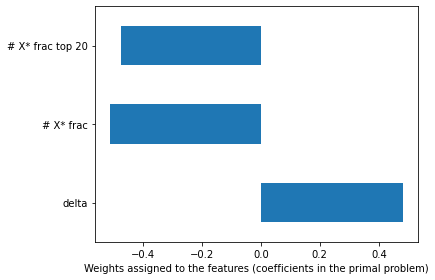

In [326]:
import matplotlib.pyplot as plt
ax = pd.Series(grid.best_estimator_.coef_.flat,index=feature_cols).plot.barh()
ax.set_xlabel('Weights assigned to the features (coefficients in the primal problem)')
plt.tight_layout()
plt.savefig(f'results/coeffs_{method}_{V_method}.png')

## Compare the results

#### For the best results determined above

In [327]:
best_method = method
best_parameters = parameters
best_results = {}
best_Vs = {}
for year in results[best_method][V_method].keys():
    best_results[year] = results[best_method][V_method][year][best_parameters]
    best_Vs[year] = Vs[V_method][year][best_parameters]

In [328]:
label = "A"
xstars = {}
indices = {}
for year in best_results.keys():
    k,details = best_results[year]
    V = best_Vs[year]
    xstar = pd.DataFrame(details['x'],index=V.index,columns=V.columns)
    xstars["%s. %s"%(label,year)] = xstar
    indices["%s. %s,%s,%s"%(label,V_method,year,method)] = details['indices']
    label = chr(ord(label)+1)
g,score_df,ordered_xstars = pyrankability.plot.show_score_xstar2(xstars,
                                                                 group_label="Group",width=500,height=500,
                                                                 columns=3,resolve_scale=True)
g.save('results/xstars_green_red_%s_%s.svg'%(best_method,best_parameters))

g,score_df,ordered_xstars = pyrankability.plot.show_score_xstar(xstars,group_label="Group",width=500,
                                                                height=500,columns=3,
                                                                resolve_scale=True)
#display(g)
g.save('results/xstars_grey_%s_%s.svg'%(best_method,best_parameters)) 

In [329]:
subset_years = ["2009","2013","2016"]
label = "A"
xstars = {}
indices = {}
for year in subset_years:
    k,details = best_results[year]
    V = best_Vs[year]
    xstar = pd.DataFrame(details['x'],index=V.index,columns=V.columns)
    xstars["%s. %s"%(label,year)] = xstar
    indices["%s. %s,%s,%s"%(label,V_method,year,method)] = details['indices']
    label = chr(ord(label)+1)
g,score_df,ordered_xstars = pyrankability.plot.show_score_xstar2(xstars,
                                                                 group_label="Group",width=500,height=500,
                                                                 columns=3,resolve_scale=True)
g.save('results/xstars_green_red_%s_%s_subset_years.svg'%(best_method,best_parameters))

g,score_df,ordered_xstars = pyrankability.plot.show_score_xstar(xstars,group_label="Group",width=500,
                                                                height=500,columns=3,
                                                                resolve_scale=True)
#display(g)
g.save('results/xstars_grey_%s_%s_subset_years.svg'%(best_method,best_parameters)) 

In [330]:
%%bash
for file in `ls results/*.svg`
do
echo $file
rsvg-convert -f pdf -o $file.pdf $file
done

results/xstars_green_red_hillside(t=0)_direct_thres=0.000000,spread_thres=0.000000,weight_indirect=1.000000.svg
results/xstars_green_red_hillside(t=0)_direct_thres=0.000000,spread_thres=0.000000,weight_indirect=1.000000_subset_years.svg
results/xstars_green_red_lop_direct_thres=1.000000,spread_thres=0.000000,weight_indirect=1.000000.svg
results/xstars_green_red_lop_direct_thres=1.000000,spread_thres=0.000000,weight_indirect=1.000000_subset_years.svg
results/xstars_grey_hillside(t=0)_direct_thres=0.000000,spread_thres=0.000000,weight_indirect=1.000000.svg
results/xstars_grey_hillside(t=0)_direct_thres=0.000000,spread_thres=0.000000,weight_indirect=1.000000_subset_years.svg
results/xstars_grey_lop_direct_thres=1.000000,spread_thres=0.000000,weight_indirect=1.000000.svg
results/xstars_grey_lop_direct_thres=1.000000,spread_thres=0.000000,weight_indirect=1.000000_subset_years.svg


## Old below

In [139]:
madness_upset_data = pd.read_excel('madnessUpsetData.xlsx',skiprows=1)
madness_upset_data["Mean C & M ESPN"] = (madness_upset_data['Colley ESPN'] + madness_upset_data['Massey ESPN'])/2
madness_upset_data["Mean C & M %"] = (madness_upset_data['Colley %'] + madness_upset_data['Massey %'])/2
madness_upset_data=madness_upset_data.set_index('Year')
madness_upset_data

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Year,,,,,,,,
2009,18.25,0.168,1310,69.841270,1370,71.428571,1340.0,70.634920
2010,27.25,0.743,1190,65.079365,760,65.079365,975.0,65.079365
2011,25.00,1.418,470,55.555556,510,55.555556,490.0,55.555556
2012,23.25,0.235,1440,71.428571,1250,66.666667,1345.0,69.047619
2013,25.25,0.781,1170,63.492063,620,60.317460,895.0,61.904761
2014,24.00,1.808,770,68.253968,680,61.904762,725.0,65.079365
2015,17.50,0.372,1160,74.603175,1060,68.253968,1110.0,71.428572
2016,26.25,0.716,970,65.079365,960,65.079365,965.0,65.079365
2017,17.50,0.672,1160,73.015873,970,73.015873,1065.0,73.015873


In [57]:
all_score_df["year"] = all_score_df["year"].astype(int)

In [58]:
all_score_df.set_index("year",inplace=True)

In [59]:
#all_score_df = all_score_df.reset_index().set_index("year").join(madness_upset_data)

In [60]:
all_score_df.index.name="Year"

In [61]:
all_score_df=all_score_df.reset_index()

In [62]:
all_score_df=all_score_df.infer_objects()

In [63]:
all_score_df = all_score_df.rename({"num_frac_xstar_upper":"# X* frac"},axis=1)

In [64]:
all_score_df

,Year,# X* frac,num_one_xstar_upper,num_zero_xstar_upper,V_method,k,method
0,2002,1374,706,0,direct,236.000000,lop
1,2002,532,1548,0,direct_indirect_weighted,1029.250000,lop
2,2003,1209,807,0,direct,213.000000,lop
3,2003,388,1628,0,direct_indirect_weighted,930.500000,lop
4,2004,1229,851,0,direct,223.500000,lop
...,...,...,...,...,...,...,...
97,2016,21,2257,0,direct_indirect_weighted,52430.999995,"hillside(t=0,nan=>0)"
98,2017,213,1803,0,direct,10216.000000,"hillside(t=0,nan=>0)"
99,2017,32,1984,0,direct_indirect_weighted,43208.999996,"hillside(t=0,nan=>0)"
100,2018,224,1792,0,direct,11253.999999,"hillside(t=0,nan=>0)"


In [65]:
all_pivot = all_score_df.pivot_table(index="Year",columns=["method","V_method"],values=["k","# X* frac"])
all_pivot

# X* frac                                                \
method   hillside(t=0)                          hillside(t=0,nan=>0)   
V_method        direct direct_indirect_weighted               direct   
Year                                                                   
2002              1010                        5                  273   
2003               630                       10                  208   
2004               603                       19                  238   
2005              1175                       20                  219   
2006               583                       11                  199   
2007               483                       11                  242   
2008               313                       15                  231   
2009               463                       18                  204   
2010               961                       11                  192   
2011               429                       38                  220   
2012               625                       18                  166   
2013               359                       22                  321   
2014               746                        1                  234   
2015               550                       10                  223   
2016              1038                       29                  256   
2017               547                       23                  213   
2018               600                       19                  224   

                                                                   \
method                               lop                            
V_method direct_indirect_weighted direct direct_indirect_weighted   
Year                                                                
2002                           12   1374                      532   
2003                           39   1209                      388   
2004                            9   1229                      129   
2005                           22   1164                      201   
2006                           30   1038                      654   
2007                           34   1340                      111   
2008                           26    835                      248   
2009                           13   1300                      121   
2010                           35    922                      169   
2011                           11    993                      156   
2012                           23   1017                      617   
2013                           17   1823                      801   
2014                           27   1413                      212   
2015                           22   1266                      161   
2016                           21   1598                      537   
2017                           32    976                      111   
2018                           25   1351                      150   

                     k                                                \
method   hillside(t=0)                          hillside(t=0,nan=>0)   
V_method        direct direct_indirect_weighted               direct   
Year                                                                   
2002        382.333333             25662.999999          9932.000000   
2003        285.999999             21681.000000          9170.000000   
2004        316.000000             20616.000000          9431.000000   
2005        200.000000             20764.999975          7963.000000   
2006        354.000000             24843.000000          9917.000000   
2007        418.000000             28757.000000         10887.000000   
2008        347.000000             24419.000000         10257.000000   
2009        401.000000             25666.000000         10159.000000   
2010        385.400000             25559.999999         10308.000000   
2011        659.000000             34257.999999         13093.000000   
2012        383.000000             31109.9

In [66]:
madness_upset_data

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Year,,,,,,,,
2009,18.25,0.168,1310,69.841270,1370,71.428571,1340.0,70.634920
2010,27.25,0.743,1190,65.079365,760,65.079365,975.0,65.079365
2011,25.00,1.418,470,55.555556,510,55.555556,490.0,55.555556
2012,23.25,0.235,1440,71.428571,1250,66.666667,1345.0,69.047619
2013,25.25,0.781,1170,63.492063,620,60.317460,895.0,61.904761
2014,24.00,1.808,770,68.253968,680,61.904762,725.0,65.079365
2015,17.50,0.372,1160,74.603175,1060,68.253968,1110.0,71.428572
2016,26.25,0.716,970,65.079365,960,65.079365,965.0,65.079365
2017,17.50,0.672,1160,73.015873,970,73.015873,1065.0,73.015873


In [67]:
madness_upset_data.index

Int64Index([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018], dtype='int64', name='Year')

In [68]:
all_pivot.loc[madness_upset_data.index]

# X* frac                                                \
method   hillside(t=0)                          hillside(t=0,nan=>0)   
V_method        direct direct_indirect_weighted               direct   
Year                                                                   
2009               463                       18                  204   
2010               961                       11                  192   
2011               429                       38                  220   
2012               625                       18                  166   
2013               359                       22                  321   
2014               746                        1                  234   
2015               550                       10                  223   
2016              1038                       29                  256   
2017               547                       23                  213   
2018               600                       19                  224   

                                                                   \
method                               lop                            
V_method direct_indirect_weighted direct direct_indirect_weighted   
Year                                                                
2009                           13   1300                      121   
2010                           35    922                      169   
2011                           11    993                      156   
2012                           23   1017                      617   
2013                           17   1823                      801   
2014                           27   1413                      212   
2015                           22   1266                      161   
2016                           21   1598                      537   
2017                           32    976                      111   
2018                           25   1351                      150   

                     k                                                \
method   hillside(t=0)                          hillside(t=0,nan=>0)   
V_method        direct direct_indirect_weighted               direct   
Year                                                                   
2009        401.000000             25666.000000         10159.000000   
2010        385.400000             25559.999999         10308.000000   
2011        659.000000             34257.999999         13093.000000   
2012        383.000000             31109.999985         11464.000000   
2013        473.000000             31147.000000         11978.000000   
2014        423.333333             29848.000000         12614.999999   
2015        368.999999             27022.999999         11049.000000   
2016        488.999999             31852.999991         11946.000000   
2017        409.000000             27595.000000         10216.000000   
2018        536.000000             28911.000000         11253.999999   

                                                                   
method                               lop                           
V_method direct_indirect_weighted direct direct_indirect_weighted  
Year                                                               
2009                 42960.999999  260.0              1152.500001  
2010                 44226.500000  238.0              1061.000000  
2011                 54351.000000  290.0              1343.500000  
2012                 48686.000000  269.0              1143.142857  
2013                 51591.999998  253.0              1138.333333  
2014                 50499.000000  276.0              1287.000000  
2015                 47965.999999  281.0              1252.000000  
2016                 52430.999995  276.0              1278.250000  
2017                 43208.999996  258.0              1153.500000  
2018                 45850.999998  254.0              1213.500001

In [69]:
for_corr = all_pivot.loc[madness_upset_data.index]
for_corr.index = madness_upset_data.index

In [70]:
for_corr.columns = [' '.join(col).strip() for col in for_corr.columns.values]

In [71]:
for_corr

,# X* frac hillside(t=0) direct,# X* frac hillside(t=0) direct_indirect_weighted,"# X* frac hillside(t=0,nan=>0) direct","# X* frac hillside(t=0,nan=>0) direct_indirect_weighted",# X* frac lop direct,# X* frac lop direct_indirect_weighted,k hillside(t=0) direct,k hillside(t=0) direct_indirect_weighted,"k hillside(t=0,nan=>0) direct","k hillside(t=0,nan=>0) direct_indirect_weighted",k lop direct,k lop direct_indirect_weighted
Year,,,,,,,,,,,,
2009,463,18,204,13,1300,121,401.000000,25666.000000,10159.000000,42960.999999,260.0,1152.500001
2010,961,11,192,35,922,169,385.400000,25559.999999,10308.000000,44226.500000,238.0,1061.000000
2011,429,38,220,11,993,156,659.000000,34257.999999,13093.000000,54351.000000,290.0,1343.500000
2012,625,18,166,23,1017,617,383.000000,31109.999985,11464.000000,48686.000000,269.0,1143.142857
2013,359,22,321,17,1823,801,473.000000,31147.000000,11978.000000,51591.999998,253.0,1138.333333
2014,746,1,234,27,1413,212,423.333333,29848.000000,12614.999999,50499.000000,276.0,1287.000000
2015,550,10,223,22,1266,161,368.999999,27022.999999,11049.000000,47965.999999,281.0,1252.000000
2016,1038,29,256,21,1598,537,488.999999,31852.999991,11946.000000,52430.999995,276.0,1278.250000
2017,547,23,213,32,976,111,409.000000,27595.000000,10216.000000,43208.999996,258.0,1153.500000


In [72]:
madness_upset_data

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Year,,,,,,,,
2009,18.25,0.168,1310,69.841270,1370,71.428571,1340.0,70.634920
2010,27.25,0.743,1190,65.079365,760,65.079365,975.0,65.079365
2011,25.00,1.418,470,55.555556,510,55.555556,490.0,55.555556
2012,23.25,0.235,1440,71.428571,1250,66.666667,1345.0,69.047619
2013,25.25,0.781,1170,63.492063,620,60.317460,895.0,61.904761
2014,24.00,1.808,770,68.253968,680,61.904762,725.0,65.079365
2015,17.50,0.372,1160,74.603175,1060,68.253968,1110.0,71.428572
2016,26.25,0.716,970,65.079365,960,65.079365,965.0,65.079365
2017,17.50,0.672,1160,73.015873,970,73.015873,1065.0,73.015873


In [73]:
madness_upset_data.shape

(10, 8)

In [ ]:
stats.pea

In [89]:
from scipy import stats
corr = pd.DataFrame(index=for_corr.columns,columns=madness_upset_data.columns)
pvalues =  pd.DataFrame(index=for_corr.columns,columns=madness_upset_data.columns)
for index in corr.index:
    for col in corr.columns:
        r,p=stats.kendalltau(for_corr[index], madness_upset_data[col])
        corr.loc[index,col]=r
        pvalues.loc[index,col]=p

In [90]:
pvalues.to_csv("results/correlation_pvalues.csv")

In [91]:
corr.to_csv("results/correlations.csv")

In [117]:
corr.abs().sort_values(by='Upset measure')

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
# X* frac hillside(t=0) direct_indirect_weighted,0.0919601,0.0898933,0.204545,0.386364,0.13484,0.04598,0.13484,0.235441
"# X* frac hillside(t=0,nan=>0) direct_indirect_weighted",0.113666,0.0666667,0.13484,0.26968,0.155556,0.295531,0.2,0.256091
"# X* frac hillside(t=0,nan=>0) direct",0.159132,0.377778,0.314627,0.26968,0.244444,0.250065,0.288889,0.302653
# X* frac lop direct,0.159132,0.111111,0.0449467,0.26968,0.0222222,0.159132,0.0222222,0.302653
k hillside(t=0) direct_indirect_weighted,0.159132,0.333333,0.314627,0.40452,0.377778,0.477396,0.333333,0.488901
"k hillside(t=0,nan=>0) direct",0.159132,0.555556,0.40452,0.449467,0.511111,0.704727,0.555556,0.675149
k lop direct_indirect_weighted,0.159132,0.333333,0.629253,0.0449467,0.2,0.204598,0.333333,0.116405
# X* frac hillside(t=0) direct,0.204598,0.0222222,0.0449467,0,0.111111,0.0681994,0.0666667,0.116405
# X* frac lop direct_indirect_weighted,0.204598,0.111111,0.0449467,0.26968,0.244444,0.522862,0.2,0.442339
k lop direct,0.204598,0.0222222,0.40452,0.0898933,0.155556,0.204598,0.2,0.069843


In [93]:
corr.abs().sort_values(by='Mean C & M %')

,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
"k hillside(t=0,nan=>0) direct",0.52793,0.0286095,0.105998,0.0724861,0.0466226,0.00518715,0.0286095,0.00820158
"k hillside(t=0,nan=>0) direct_indirect_weighted",0.321277,0.155742,0.105998,0.0724861,0.0466226,0.00518715,0.0725502,0.0138421
k hillside(t=0) direct_indirect_weighted,0.52793,0.216373,0.208668,0.105998,0.155742,0.0582906,0.216373,0.0555726
# X* frac lop direct_indirect_weighted,0.417077,0.72749,0.857462,0.281198,0.38072,0.0380942,0.484313,0.0832645
k hillside(t=0) direct,0.0866808,0.0466226,0.208668,0.0195503,0.291248,0.241129,0.216373,0.0832645
"# X* frac hillside(t=0,nan=>0) direct",0.52793,0.155742,0.208668,0.281198,0.38072,0.321277,0.291248,0.235983
# X* frac lop direct,0.52793,0.72749,0.857462,0.281198,1,0.52793,1,0.235983
"# X* frac hillside(t=0,nan=>0) direct_indirect_weighted",0.652109,0.861801,0.590014,0.281198,0.600654,0.241129,0.484313,0.315974
# X* frac hillside(t=0) direct_indirect_weighted,0.717294,0.719438,0.417119,0.12535,0.590014,0.856337,0.590014,0.360151
# X* frac hillside(t=0) direct,0.417077,1,0.857462,1,0.72749,0.786775,0.861801,0.648532


In [74]:
all_correlations.index = [' '.join(col).strip() for col in all_correlations.index.values]

In [75]:
all_correlations.columns = [' '.join(col).strip() for col in all_correlations.columns.values]

In [77]:
all_correlations.to_csv('results/correlations.csv')

In [78]:
all_correlations

,Colley % hillside(t=0),"Colley % hillside(t=0,nan=>0)",Colley % hillside(t=10),"Colley % hillside(t=10,nan=>0)",Colley % hillside(t=5),"Colley % hillside(t=5,nan=>0)",Colley % lop,Colley ESPN hillside(t=0),"Colley ESPN hillside(t=0,nan=>0)",Colley ESPN hillside(t=10),...,Variance of upset hillside(t=5),"Variance of upset hillside(t=5,nan=>0)",Variance of upset lop,k hillside(t=0),"k hillside(t=0,nan=>0)",k hillside(t=10),"k hillside(t=10,nan=>0)",k hillside(t=5),"k hillside(t=5,nan=>0)",k lop
Colley % hillside(t=0),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.646895,0.646895,0.646895,...,-0.544339,-0.544339,-0.544339,-0.596343,-0.536146,0.184170,0.243871,-0.368677,-0.422132,-0.179935
"Colley % hillside(t=0,nan=>0)",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.646895,0.646895,0.646895,...,-0.544339,-0.544339,-0.544339,-0.596343,-0.536146,0.184170,0.243871,-0.368677,-0.422132,-0.179935
Colley % hillside(t=10),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.646895,0.646895,0.646895,...,-0.544339,-0.544339,-0.544339,-0.596343,-0.536146,0.184170,0.243871,-0.368677,-0.422132,-0.179935
"Colley % hillside(t=10,nan=>0)",1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.646895,0.646895,0.646895,...,-0.544339,-0.544339,-0.544339,-0.596343,-0.536146,0.184170,0.243871,-0.368677,-0.422132,-0.179935
Colley % hillside(t=5),1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.646895,0.646895,0.646895,...,-0.544339,-0.544339,-0.544339,-0.596343,-0.536146,0.184170,0.243871,-0.368677,-0.422132,-0.179935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
k hillside(t=10),0.184170,0.184170,0.184170,0.184170,0.184170,0.184170,0.184170,0.005267,0.005267,0.005267,...,0.217157,0.217157,0.217157,0.085708,0.205093,1.000000,0.982356,0.717638,0.760822,0.485326
"k hillside(t=10,nan=>0)",0.243871,0.243871,0.243871,0.243871,0.243871,0.243871,0.243871,0.067067,0.067067,0.067067,...,0.132770,0.132770,0.132770,-0.032405,0.141783,0.982356,1.000000,0.611505,0.683904,0.443371
k hillside(t=5),-0.368677,-0.368677,-0.368677,-0.368677,-0.368677,-0.368677,-0.368677,-0.345546,-0.345546,-0.345546,...,0.585822,0.585822,0.585822,0.474174,0.397530,0.717638,0.611505,1.000000,0.972999,0.523112
"k hillside(t=5,nan=>0)",-0.422132,-0.422132,-0.422132,-0.422132,-0.422132,-0.422132,-0.422132,-0.401775,-0.401775,-0.401775,...,0.615625,0.615625,0.615625,0.438497,0.449659,0.760822,0.683904,0.972999,1.000000,0.551777


In [64]:
lop_results = all_score_df.loc[all_score_df.Group.str.startswith("A.")]
lop_results = lop_results.rename({"k":"LOP k","num_frac_xstar_upper":"LOP #fractional"},axis=1)
lop_results_for_corr = lop_results.dropna().drop(["index","Group","V_method"],axis=1)
lop_results_for_corr=lop_results_for_corr.infer_objects()

In [65]:
lop_C=lop_results_for_corr.corr().loc[["LOP #fractional","LOP k"]]
lop_C

,LOP #fractional,num_one_xstar_upper,num_zero_xstar_upper,LOP k,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
LOP #fractional,1.00000,-0.902213,NaN,-0.11764,0.289080,-0.189722,0.155596,-0.254752,-0.178118,-0.436781,-0.021984,-0.366146
LOP k,-0.11764,0.458092,NaN,1.00000,-0.026625,0.470888,-0.651733,-0.179935,-0.211645,-0.389947,-0.445529,-0.301743


In [66]:
hillside_results = all_score_df.loc[all_score_df.Group.str.startswith("B.")]
hillside_results=hillside_results.rename({"k":"Hillside k","num_frac_xstar_upper":"Hillside #fractional"},axis=1)
hillside_results_for_corr = hillside_results.dropna().drop(["index","Group","V_method"],axis=1)
hillside_results_for_corr=hillside_results_for_corr.infer_objects()

In [67]:
all_results = hillside_results.set_index("index").join(lop_results.set_index("index").drop(['Group', 'num_one_xstar_upper', 'num_zero_xstar_upper', 'V_method',
       'Upset measure', 'Variance of upset', 'Colley ESPN', 'Colley %',
       'Massey ESPN', 'Massey %', 'Mean C & M ESPN', 'Mean C & M %'],axis=1))

In [68]:
hillside_C=hillside_results_for_corr.corr().loc[["Hillside #fractional","Hillside k"]]
hillside_C

,Hillside #fractional,num_one_xstar_upper,num_zero_xstar_upper,Hillside k,Upset measure,Variance of upset,Colley ESPN,Colley %,Massey ESPN,Massey %,Mean C & M ESPN,Mean C & M %
Hillside #fractional,1.000000,0.042019,NaN,0.310499,-0.029805,0.077716,0.126216,0.251194,0.184395,-0.023352,0.166784,0.120595
Hillside k,0.310499,0.657316,NaN,1.000000,0.407104,0.403628,-0.572358,-0.596343,-0.457328,-0.716541,-0.543652,-0.695106


In [ ]:
hillside_results = all_score_df.loc[all_score_df.Group.str.startswith("C.")]
hillside_results=hillside_results.rename({"k":"Hillside k","num_frac_xstar_upper":"Hillside #fractional"},axis=1)
hillside_results_for_corr = hillside_results.dropna().drop(["index","Group","V_method"],axis=1)
hillside_results_for_corr=hillside_results_for_corr.infer_objects()

In [69]:
all_results = all_results.infer_objects()

In [70]:
rows = ["LOP k","Hillside k","LOP #fractional","Hillside #fractional"]
cols = ["Upset measure","Variance of upset","Mean C & M ESPN","Mean C & M %"]
all_results.dropna().corr().loc[rows,cols]

,Upset measure,Variance of upset,Mean C & M ESPN,Mean C & M %
LOP k,-0.026625,0.470888,-0.445529,-0.301743
Hillside k,0.407104,0.403628,-0.543652,-0.695106
LOP #fractional,0.289080,-0.189722,-0.021984,-0.366146
Hillside #fractional,-0.029805,0.077716,0.166784,0.120595


In [72]:
print(all_results.dropna().corr().loc[rows,cols].to_latex())

\begin{tabular}{lrrrr}
\toprule
{} &  Upset measure &  Variance of upset &  Mean C \& M ESPN &  Mean C \& M \% \\
\midrule
LOP k                &      -0.026625 &           0.470888 &        -0.445529 &     -0.301743 \\
Hillside k           &       0.407104 &           0.403628 &        -0.543652 &     -0.695106 \\
LOP \#fractional      &       0.289080 &          -0.189722 &        -0.021984 &     -0.366146 \\
Hillside \#fractional &      -0.029805 &           0.077716 &         0.166784 &      0.120595 \\
\bottomrule
\end{tabular}



In [49]:
all_results.dropna().corr().loc[cols,cols]

,Upset measure,Variance of upset,Mean C & M ESPN,Mean C & M %
Upset measure,1.000000,0.464539,-0.234786,-0.626385
Variance of upset,0.464539,1.000000,-0.711477,-0.600218
Mean C & M ESPN,-0.234786,-0.711477,1.000000,0.789900
Mean C & M %,-0.626385,-0.600218,0.789900,1.000000


In [50]:
all_results.dropna().corr().loc[rows,rows]

,LOP k,Hillside k,LOP #fractional,Hillside #fractional
LOP k,1.000000,0.598301,-0.117640,0.162873
Hillside k,0.598301,1.000000,0.563186,0.310499
LOP #fractional,-0.117640,0.563186,1.000000,0.333616
Hillside #fractional,0.162873,0.310499,0.333616,1.000000


In [68]:
import sklearn.linear_model as skl_lm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn.svm import SVR
from sklearn.dummy import DummyRegressor

In [229]:
pred_col = 'Upset measure'

In [259]:

model = DummyRegressor()

loo = LeaveOneOut()
y = lop_results.dropna()[pred_col]
X = pd.DataFrame(index=y.index)

scores = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=loo, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MAE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 10, MAE: 3.6, STD: 2.068995104088152


In [245]:
#model = DecisionTreeRegressor(random_state=0)

model = SVR(C=1.0, gamma='scale',epsilon=0.2) #skl_lm.LinearRegression()

loo = LeaveOneOut()
X = lop_results.dropna()[['k']]
y = lop_results.dropna()[pred_col]#.values.reshape(-1,1)

scores = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=loo, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MAE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 10, MAE: 3.769057209880998, STD: 2.492272746277834


In [246]:
loo = LeaveOneOut()
X = lop_results.dropna()[['num_frac_xstar_upper']]
y = lop_results.dropna()[pred_col]#.values.reshape(-1,1)

scores = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=loo, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MAE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 10, MAE: 3.1522601171758544, STD: 2.461471646177883


In [249]:
loo = LeaveOneOut()
combined_results = hillside_results[[pred_col,'k','index']].set_index('index').join(lop_results[['num_frac_xstar_upper','index']].set_index('index'))
X = combined_results.dropna()[['k','num_frac_xstar_upper']]
y = combined_results.dropna()[pred_col]#.values.reshape(-1,1)

scores = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=loo, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MAE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 10, MAE: 3.4967552304177842, STD: 2.5290833439379985


In [250]:
loo = LeaveOneOut()
combined_results = hillside_results[[pred_col,'k','index']].set_index('index').join(lop_results[['num_frac_xstar_upper','index']].set_index('index'))
X = combined_results.dropna()[['k']]
y = combined_results.dropna()[pred_col]#.values.reshape(-1,1)

scores = cross_val_score(model, X, y, scoring="neg_mean_absolute_error", cv=loo, n_jobs=1)

print("Folds: " + str(len(scores)) + ", MAE: " + str(np.mean(np.abs(scores))) + ", STD: " + str(np.std(scores)))

Folds: 10, MAE: 3.6932180748143546, STD: 2.5182476783971244


In [243]:
perm=np.array(details['P'][0])

In [244]:
V.iloc[perm,:].iloc[:,perm]

team2,Virginia,Villanova,Kansas,Duke,West_Virginia,Auburn,Xavier,Tennessee,Cincinnati,North_Carolina,...,Seton_Hall,UMBC,Florida_St,Miami_FL,Alabama,Texas_A&M,Virginia_Tech,Texas,Oklahoma,Syracuse
team1,,,,,,,,,,,,,,,,,,,,,
Virginia,NaN,NaN,0.0,8.0,1.0,1.0,0.0,3.0,0.0,11.0,...,2.0,NaN,16.0,16.0,2.0,1.0,18.0,2.0,0.0,22.0
Villanova,NaN,NaN,NaN,1.0,NaN,2.0,19.0,3.0,4.0,0.0,...,23.0,1.0,NaN,0.0,0.0,1.0,NaN,1.0,NaN,3.0
Kansas,2.0,NaN,NaN,0.0,20.0,1.0,0.0,0.0,NaN,1.0,...,0.0,NaN,0.0,1.0,5.0,4.0,2.0,23.0,21.0,6.0
Duke,4.0,0.0,0.0,NaN,3.0,1.0,0.0,2.0,1.0,14.0,...,1.0,NaN,13.0,16.0,2.0,1.0,16.0,3.0,2.0,14.0
West_Virginia,3.0,NaN,12.0,2.0,NaN,0.0,0.0,1.0,1.0,1.0,...,0.0,1.0,2.0,1.0,3.0,1.0,1.0,16.0,23.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Texas_A&M,2.0,0.0,4.0,0.0,6.0,4.0,NaN,7.0,1.0,0.0,...,0.0,1.0,1.0,NaN,10.0,NaN,1.0,4.0,7.0,0.0
Virginia_Tech,0.0,NaN,1.0,4.0,0.0,0.0,0.0,2.0,NaN,7.0,...,0.0,1.0,7.0,5.0,1.0,0.0,NaN,1.0,NaN,9.0
Texas,1.0,1.0,7.0,0.0,11.0,1.0,0.0,2.0,NaN,0.0,...,0.0,1.0,0.0,0.0,5.0,3.0,0.0,NaN,19.0,0.0


In [32]:
all_score_df.loc[all_score_df.index.str.startswith("A.")]

,num_frac_xstar_upper,num_one_xstar_upper,num_zero_xstar_upper,year,V_method
Group,,,,,
"A. map1,2002,lop",192,1888,0,2002,map1
"A. map1,2003,lop",108,1908,0,2003,map1
"A. map1,2004,lop",92,1988,0,2004,map1
"A. map1,2005,lop",371,1709,0,2005,map1
"A. map1,2006,lop",345,1735,0,2006,map1
"A. map1,2007,lop",84,1996,0,2007,map1
"A. map1,2008,lop",105,1911,0,2008,map1
"A. map1,2009,lop",133,1883,0,2009,map1
"A. map1,2010,lop",118,1962,0,2010,map1


## Hillside

In [33]:
V.iloc[perm,:].iloc[:,perm]

team2,Virginia,Villanova,Kansas,Duke,West_Virginia,Auburn,Xavier,Tennessee,Cincinnati,North_Carolina,...,Seton_Hall,UMBC,Florida_St,Miami_FL,Alabama,Texas_A&M,Virginia_Tech,Texas,Oklahoma,Syracuse
team1,,,,,,,,,,,,,,,,,,,,,
Virginia,NaN,NaN,0.0,8.0,1.0,1.0,0.0,3.0,0.0,11.0,...,2.0,NaN,16.0,16.0,2.0,1.0,18.0,2.0,0.0,22.0
Villanova,NaN,NaN,NaN,1.0,NaN,2.0,19.0,3.0,4.0,0.0,...,23.0,1.0,NaN,0.0,0.0,1.0,NaN,1.0,NaN,3.0
Kansas,2.0,NaN,NaN,0.0,20.0,1.0,0.0,0.0,NaN,1.0,...,0.0,NaN,0.0,1.0,5.0,4.0,2.0,23.0,21.0,6.0
Duke,4.0,0.0,0.0,NaN,3.0,1.0,0.0,2.0,1.0,14.0,...,1.0,NaN,13.0,16.0,2.0,1.0,16.0,3.0,2.0,14.0
West_Virginia,3.0,NaN,12.0,2.0,NaN,0.0,0.0,1.0,1.0,1.0,...,0.0,1.0,2.0,1.0,3.0,1.0,1.0,16.0,23.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Texas_A&M,2.0,0.0,4.0,0.0,6.0,4.0,NaN,7.0,1.0,0.0,...,0.0,1.0,1.0,NaN,10.0,NaN,1.0,4.0,7.0,0.0
Virginia_Tech,0.0,NaN,1.0,4.0,0.0,0.0,0.0,2.0,NaN,7.0,...,0.0,1.0,7.0,5.0,1.0,0.0,NaN,1.0,NaN,9.0
Texas,1.0,1.0,7.0,0.0,11.0,1.0,0.0,2.0,NaN,0.0,...,0.0,1.0,0.0,0.0,5.0,3.0,0.0,NaN,19.0,0.0


In [34]:
import altair as alt
from vega_datasets import data

for V_method in Vs.keys():
    xstars = {}
    indices = {}
    label = "A"
    print(V_method)
    for year in games.keys():
        for method in results.keys():
            if "hillside" in method:
                k,details = results[method][V_method][year]
                V=Vs[V_method][year]
                perm=pd.Series(details['P'][0],index=V.columns)
                r=perm.argsort()
                #V_G=V.iloc[perm,:].iloc[:,perm]
                
                #x = pd.DataFrame(details['x'],index=V.index,columns=V.columns).iloc[perm,:].iloc[:,perm]
                #r = x.sum(axis=1)

                df=V.stack().to_frame().reset_index()
                df.columns=["team_i_name","team_k_name","v"]
                df["ri"] = list(r.loc[df["team_i_name"]])
                df["rk"] = list(r.loc[df["team_k_name"]])
                
                g=alt.Chart(df).mark_circle().encode(
                    x=alt.X(
                        'team_i_name:N',
                        axis=alt.Axis(labelOverlap=False),
                        title="r",
                        sort=alt.SortField(field="ri",order="ascending") # The order to sort in
                    ),
                    y=alt.Y(
                        'team_k_name:N',
                        axis=alt.Axis(labelOverlap=False),
                        title="r",
                        sort=alt.SortField(field="rk",order="ascending") # The order to sort in
                    ),
                    size='v:Q'
                )
                g.save('results/hillside_bubble_%s_%s_%s.png'%(V_method,method,year))

map1


In [51]:
from sklearn.metrics import pairwise_distances
from pandas import DataFrame, merge
from scipy.spatial.distance import pdist, squareform
from scipy.sparse import csr_matrix

import networkx as nx

V_methods=[]
years=[]
thresholds=[]
methods=[]
nconns=[]
ks = []
kmaxs = []
for V_method in Vs.keys():
    xstars = {}
    indices = {}
    label = "A"
    print(V_method)
    for year in games.keys():
        for method in results.keys():
            if "hillside(t=0)" in method:
                k,details = results[method][V_method][year]
                V=Vs[V_method][year]
                X = np.round(details['x'])
                perm=np.array(details['P'][0])
                V_G=V.iloc[perm,:].iloc[:,perm].copy()
                                
                #x = pd.DataFrame(details['x'],index=V.index,columns=V.columns)
                #r = x.sum(axis=1)

                df=V_G.stack(dropna=True).to_frame()
                df.columns=["v"]

                distances = pdist(df.values)
                dist_matrix = pd.DataFrame(squareform(distances))
                dist_matrix.index=df.index
                dist_matrix.columns=df.index
                V_thresholds = list(np.sort(np.unique(distances)))
                print(len(V_thresholds))
                if V_thresholds[0] != 0:
                    V_thresholds.insert(0,0)
                
                names = V_G.columns
                S = V_G.values
                c = np.zeros(S.shape)
                
                for threshold in V_thresholds:
                    C = pyrankability.construct.C_count(V,threshold=threshold)
                    k = np.sum(np.sum(X*C))
                    nconn=0
                    for i in range(S.shape[0]):
                        break
                        G_row=nx.Graph()
                        G_col=nx.Graph()
                        for jx in range(0,S.shape[0]):
                            G_row.add_node(names[jx])
                            G_col.add_node(names[jx])
                        for ix in range(0,S.shape[0]-1):
                            for jx in range(ix+1,S.shape[0]):
                                if np.abs(S[i,ix]-S[i,jx])<=threshold:
                                    G_row.add_edge(names[ix],names[jx])
                                if np.abs(S[ix,i]-S[jx,i])<=threshold:
                                    G_col.add_edge(names[ix],names[jx])
                                
                        nconn+=nx.number_connected_components(G_row)+nx.number_connected_components(G_col)
                    V_methods.append(V_method)
                    years.append(year)
                    thresholds.append(threshold)
                    methods.append(method)
                    nconns.append(nconn)
                    ks.append(k)
                    kmaxs.append(pyrankability.common.nCr(len(V),2)*(len(V)-1))
                    print(V_method,method,year,threshold,nconn,k)
                    #if nconn == 2*S.shape[0]:
                    #    break # using more thresholds doesn't matter

map1
31
map1 hillside(t=0) 2002 0.0 0 28980.0
map1 hillside(t=0) 2002 1.0 0 15501.0
map1 hillside(t=0) 2002 2.0 0 10027.0
map1 hillside(t=0) 2002 3.0 0 7562.0
map1 hillside(t=0) 2002 4.0 0 6247.0
map1 hillside(t=0) 2002 5.0 0 5215.0
map1 hillside(t=0) 2002 6.0 0 4445.0
map1 hillside(t=0) 2002 7.0 0 3931.0
map1 hillside(t=0) 2002 8.0 0 3350.0
map1 hillside(t=0) 2002 9.0 0 2683.0
map1 hillside(t=0) 2002 10.0 0 2229.0
map1 hillside(t=0) 2002 11.0 0 1836.0
map1 hillside(t=0) 2002 12.0 0 1447.0
map1 hillside(t=0) 2002 13.0 0 1131.0
map1 hillside(t=0) 2002 14.0 0 888.0
map1 hillside(t=0) 2002 15.0 0 642.0
map1 hillside(t=0) 2002 16.0 0 522.0
map1 hillside(t=0) 2002 17.0 0 431.0
map1 hillside(t=0) 2002 18.0 0 323.0
map1 hillside(t=0) 2002 19.0 0 219.0
map1 hillside(t=0) 2002 20.0 0 152.0
map1 hillside(t=0) 2002 21.0 0 110.0
map1 hillside(t=0) 2002 22.0 0 87.0
map1 hillside(t=0) 2002 23.0 0 70.0
map1 hillside(t=0) 2002 24.0 0 39.0
map1 hillside(t=0) 2002 25.0 0 15.0
map1 hillside(t=0) 2002 26.

In [52]:
hillside_results=pd.DataFrame({"V_method":V_methods,"year":years,"threshold":thresholds,"method":methods,"nconn":nconns,"k":ks,"kmax":kmaxs})
mins=hillside_results.groupby(["V_method","year","method"])["nconn"].min()
mins.name="min_nconn"
maxs=hillside_results.groupby(["V_method","year","method"])["nconn"].max()
maxs.name="max_nconn"
hillside_results=hillside_results.set_index(["V_method","year","method"]).join(mins.to_frame()).join(maxs.to_frame()).reset_index()
hillside_results["norm_nconn"] = hillside_results["nconn"]/hillside_results["max_nconn"]
hillside_results["knorm"] = hillside_results["k"]/hillside_results["kmax"]

In [53]:
hillside_results.head()

,V_method,year,method,threshold,nconn,k,kmax,min_nconn,max_nconn,norm_nconn,knorm
0,map1,2002,hillside(t=0),0.0,0,28980.0,133120,0,0,NaN,0.217698
1,map1,2002,hillside(t=0),1.0,0,15501.0,133120,0,0,NaN,0.116444
2,map1,2002,hillside(t=0),2.0,0,10027.0,133120,0,0,NaN,0.075323
3,map1,2002,hillside(t=0),3.0,0,7562.0,133120,0,0,NaN,0.056806
4,map1,2002,hillside(t=0),4.0,0,6247.0,133120,0,0,NaN,0.046928


In [54]:
import altair as alt
from vega_datasets import data

g = alt.Chart(hillside_results.loc[hillside_results.year.isin(["2009","2014","2018"])]).mark_line().encode(
    x='threshold',
    y=alt.Y('knorm'),#,scale=alt.Scale(domain=[0, 1.])),
    color='year',
    strokeDash='method',
)
g.save('results/k.png')

In [71]:
len(V)

64

In [70]:
np.sum(np.isnan(np.tril(V,-1)))+np.sum(np.isnan(np.triu(V,1)))

1122

In [69]:
np.sum(np.isnan(np.tril(V,-1)))

561

In [31]:
len(distances)

3254650

In [83]:
movements = {}
for D_method in Ds.keys():
    movements[D_method] = {}
    for C_method in Cs[D_method].keys():
        movements[D_method][C_method] = {}
        for year in games.keys():
            movements[D_method][C_method][year] = {}

In [91]:
error_margin = 2
for year in games.keys():
    for D_method in Ds.keys():
        for C_method in Cs[D_method].keys():
                for method in results.keys():
                    if method == "hillside":
                        D = Ds[D_method][year]
                        C = Cs[D_method][C_method][year]
                        if subset is not None:
                            D = D.iloc[:subset,:].iloc[:,:subset]
                            C = C.iloc[:subset,:].iloc[:,:subset]
                        k,details = results[method][D_method][C_method][year]
                        x = pd.DataFrame(pyrankability.common.threshold_x(details['x']))
                        x.columns = D.columns
                        x.index = D.index
                        #print(k,np.sum(np.sum(x.values*C.values)))
                        r = np.sum(x.values,axis=1)
                        order = np.argsort(-r)
                        xr = x.iloc[order,:].iloc[:,order]
                        cr = C.iloc[order,:].iloc[:,order]
                        old_score = np.sum(np.triu(cr))                        
                        start_positions = []
                        highest_positions = []
                        lowest_positions = []
                        higher_errors = []
                        lower_errors = []
                        for start_pos,item in enumerate(order):
                            item_errors = []
                            start_positions.append(start_pos)
                            highest_position = start_pos
                            for test_highest_position in range(start_pos-1,-1,-1):
                                new_order = copy.copy(order)
                                new_order[start_pos],new_order[test_highest_position] = new_order[test_highest_position],new_order[start_pos]
                                new_cr = C.iloc[new_order,:].iloc[:,new_order]
                                new_score = np.sum(np.triu(new_cr))                        
                                test_error = new_score - old_score
                                if test_error <= error_margin:
                                    item_errors.append(test_error)
                                    highest_position = test_highest_position
                            highest_positions.append(highest_position)
                            higher_errors.append(item_errors)
                            lowest_position = start_pos
                            item_errors = []
                            for test_lowest_position in range(start_pos,len(order)):
                                new_order = copy.copy(order)
                                new_order[start_pos],new_order[test_lowest_position] = new_order[test_lowest_position],new_order[start_pos]
                                new_cr = C.iloc[new_order,:].iloc[:,new_order]
                                new_score = np.sum(np.triu(new_cr))                        
                                test_error = new_score - old_score
                                if test_error <= error_margin:
                                    item_errors.append(test_error)
                                    lowest_position = test_lowest_position
                            lowest_positions.append(lowest_position)
                            lower_errors.append(item_errors)
                        movement_df = pd.DataFrame({"item":order,"team":xr.columns,"start":start_positions,"highest":highest_positions,"higher_error":higher_errors,
                                                    "lowest":lowest_positions,"lower_error":lower_errors})
                        movements[D_method][C_method][year][method] = movement_df
                        lkdjf

NameError: name 'lkdjf' is not defined

In [92]:
movements[D_method][C_method][year][method].head()

,item,team,start,highest,higher_error,lowest,lower_error
0,33,Butler,0,0,[],2,"[0.0, 0.0, 1.0]"
1,10,Arizona_St,1,0,[0.0],2,"[0.0, 0.0]"
2,18,BYU,2,0,"[0.0, 1.0]",3,"[0.0, 2.0]"
3,25,Boston_College,3,2,[2.0],4,"[0.0, 1.0]"
4,40,California,4,3,[1.0],5,"[0.0, 1.0]"


<BarContainer object of 50 artists>

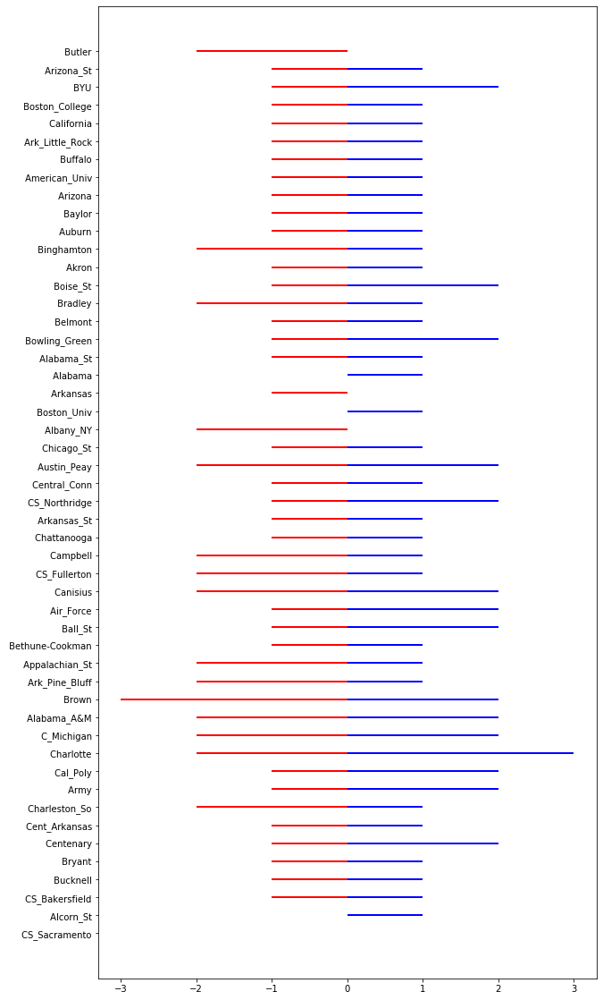

In [104]:
import matplotlib.pyplot as plt

movements[D_method][C_method][year][method]

x = movements[D_method][C_method][year][method].team
negative_data = movements[D_method][C_method][year][method].start - movements[D_method][C_method][year][method].lowest
positive_data = movements[D_method][C_method][year][method].start - movements[D_method][C_method][year][method].highest

fig = plt.figure(figsize=(10, 20))
ax = plt.subplot(111)
ax.barh(x[::-1], negative_data[::-1], height=.1, color='r')
ax.barh(x[::-1], positive_data[::-1], height=.1, color='b')

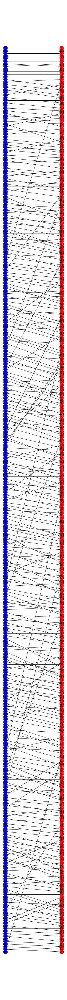

In [49]:
pyrankability.plot.spider(pyrankability.plot.AB_to_P2(massey_ranking,colley_ranking),height=80)

In [50]:
c = pyrankability.common.compute_C(D_N_347_MM2009.values)

In [56]:
massey_x = 1-pyrankability.common.perm_to_x(massey_ranking)
colley_x = 1-pyrankability.common.perm_to_x(colley_ranking)
k_massey = np.sum(c*massey_x)
k_colley = np.sum(c*colley_x)
print('k hillside:\t',int(k_hillside))
print('k massey:\t',(int(k_massey)-int(k_hillside))/int(k_hillside))
print('k colley:\t',(int(k_colley)-int(k_hillside))/int(k_hillside))

k hillside:	 1208319
k massey:	 0.022741511140683877
k colley:	 0.02193294982533586


In [18]:
pd.DataFrame(pyrankability.common.threshold_x(details_hillside['x']))

,0,1,2,3,4,5,6,7,8,9,...,337,338,339,340,341,342,343,344,345,346
0,0.000000,0.000000,0.0,1.0,0.0,0.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.846297,1.0
1,1.000000,0.000000,1.0,1.0,1.0,1.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,1.000000,1.0,0.839916,0.0,1.000000,1.0
2,1.000000,0.000000,0.0,1.0,1.0,1.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,1.000000,0.0,0.000000,0.0,1.000000,1.0
3,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,1.0
4,1.000000,0.000000,0.0,1.0,0.0,0.539476,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.601609,0.0,0.000000,0.0,1.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,1.000000,0.000000,1.0,1.0,1.0,1.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,1.000000,0.0,0.000000,0.0,1.000000,1.0
343,1.000000,0.160084,1.0,1.0,1.0,1.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,1.000000,1.0,0.000000,0.0,1.000000,1.0
344,1.000000,1.000000,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.000000,1.0,1.000000,0.0,1.000000,1.0
345,0.153703,0.000000,0.0,1.0,0.0,0.000000,1.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,1.0


In [36]:
g,score_df,ordered_xstars = pyrankability.plot.show_score_xstar({"D_N_347_MM2009":pd.DataFrame(details_hillside['x'])},group_label="Group",
                                                                width=2000,height=2000)
display(g)

alt.FacetChart(...)

In [ ]:
k_lop,details_lop = pyrankability.rank.solve(D_N_347_MM2009,method='lop',lazy=True, cont=True)
k_lop

In [16]:
k_hillside

1208319.9999025436